# Real-Time PPE Detection using YOLOv8

## Project Objective

This project builds a computer vision pipeline for detecting Personal Protective Equipment (PPE) in workplace environments using YOLOv8.

The goal is not only to train an object detection model, but to build a structured workflow covering:

- dataset validation
- class filtering
- annotation preprocessing
- model training
- evaluation
- inference on images, videos, and webcam streams

The project is designed as an applied computer vision system for workplace safety monitoring.


## Environment Setup

This project uses Ultralytics YOLOv8 for object detection and Roboflow for dataset versioning, preprocessing, annotation management, and YOLO-format dataset export.

The required libraries are installed before starting the training workflow.

In [2]:
pip install -U ultralytics roboflow opencv-python matplotlib pandas pyyaml jupyter ipykernel

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.3 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## Library Imports

The notebook imports YOLO for model training and inference, Roboflow for dataset access, and utility libraries for file handling, visualization, and dataset inspection.

In [2]:
from ultralytics import YOLO
from roboflow import Roboflow

import os
import cv2
import torch
import yaml
import shutil
import random
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path

print("Setup successful")

Setup successful


## Problem Statement

Workplace safety is an important requirement in construction and industrial environments. 
Workers are often required to wear personal protective equipment such as helmets and safety vests.

Manual monitoring is not always scalable, especially in large work areas. 
This project uses computer vision to detect PPE items in images and videos.

The goal is to build an object detection model that can identify safety helmets and safety vests using YOLO.

## Dataset Path Setup

The dataset is stored locally in YOLO format.  
The notebook first checks whether the main dataset folder and configuration file are available before any preprocessing or training steps are executed.

In [18]:
dataset_path = Path("D:\Yolo\yolo-ppe-detection")
yaml_path = dataset_path / "data.yaml"

print("Dataset path:", dataset_path)
print("Dataset folder exists:", dataset_path.exists())
print("data.yaml exists:", yaml_path.exists())

Dataset path: D:\Yolo\yolo-ppe-detection
Dataset folder exists: True
data.yaml exists: True


## Dataset Structure Validation

YOLO training requires separate image and label folders for each dataset split.

This step validates the train, validation, and test folders and checks whether image-label files are available before training.

In [19]:
splits = ["train", "valid", "test"]

for split in splits:
    image_dir = dataset_path / split / "images"
    label_dir = dataset_path / split / "labels"

    images = list(image_dir.glob("*")) if image_dir.exists() else []
    labels = list(label_dir.glob("*.txt")) if label_dir.exists() else []

    print(f"\n{split.upper()} SET")
    print("Images folder exists:", image_dir.exists())
    print("Labels folder exists:", label_dir.exists())
    print("Number of images:", len(images))
    print("Number of labels:", len(labels))


TRAIN SET
Images folder exists: True
Labels folder exists: True
Number of images: 30765
Number of labels: 30765

VALID SET
Images folder exists: True
Labels folder exists: True
Number of images: 8814
Number of labels: 8814

TEST SET
Images folder exists: True
Labels folder exists: True
Number of images: 4423
Number of labels: 4423


## Dataset Configuration Inspection

The `data.yaml` file defines the dataset paths, number of classes, and class names.

Inspecting this file is important because YOLO uses it as the main training configuration.

In [20]:
with open(yaml_path, "r") as file:
    data_config = yaml.safe_load(file)

print("YAML loaded successfully")
print("Number of classes:", data_config["nc"])
print("Class names:")

for idx, name in enumerate(data_config["names"]):
    print(idx, name)

YAML loaded successfully
Number of classes: 14
Class names:
0 Fall-Detected
1 Gloves
2 Goggles
3 Hardhat
4 Ladder
5 Mask
6 NO-Gloves
7 NO-Goggles
8 NO-Hardhat
9 NO-Mask
10 NO-Safety Vest
11 Person
12 Safety Cone
13 Safety Vest


The dataset contains separate training, validation, and testing folders. 
The YAML file defines the dataset paths and class names, which are required by YOLO during training.

## Focused Class Selection

The original dataset contains more PPE-related classes than required for this project.

This project focuses on the most relevant workplace safety classes:

- Hardhat
- Safety Vest
- NO-Hardhat
- NO-Safety Vest
- Person

Reducing the class scope makes the detection problem more focused and easier to evaluate.

In [21]:
original_names = data_config["names"]

selected_classes = [
    "Hardhat",
    "Safety Vest",
    "NO-Hardhat",
    "NO-Safety Vest",
    "Person"
]

missing_classes = [cls for cls in selected_classes if cls not in original_names]

if missing_classes:
    raise ValueError(f"Missing classes in dataset: {missing_classes}")

selected_class_ids = [original_names.index(cls) for cls in selected_classes]

print("Selected classes:", selected_classes)
print("Original class IDs:", selected_class_ids)

Selected classes: ['Hardhat', 'Safety Vest', 'NO-Hardhat', 'NO-Safety Vest', 'Person']
Original class IDs: [3, 13, 8, 10, 11]


## Annotation Filtering and Class Remapping

YOLO labels store class IDs as numbers.

Since only selected PPE classes are used, the original class IDs are remapped into a new continuous range starting from 0.

Only images containing at least one selected class are copied into the filtered dataset.

In [22]:
filtered_dataset = dataset_path / "dataset_filtered"

class_id_mapping = {
    old_id: new_id for new_id, old_id in enumerate(selected_class_ids)
}

if filtered_dataset.exists():
    shutil.rmtree(filtered_dataset)

for split in splits:
    image_input_dir = dataset_path / split / "images"
    label_input_dir = dataset_path / split / "labels"

    image_output_dir = filtered_dataset / split / "images"
    label_output_dir = filtered_dataset / split / "labels"

    image_output_dir.mkdir(parents=True, exist_ok=True)
    label_output_dir.mkdir(parents=True, exist_ok=True)

    for label_file in label_input_dir.glob("*.txt"):
        new_lines = []

        with open(label_file, "r") as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()

            if len(parts) != 5:
                continue

            old_class_id = int(parts[0])

            if old_class_id in class_id_mapping:
                new_class_id = class_id_mapping[old_class_id]
                new_line = " ".join([str(new_class_id)] + parts[1:])
                new_lines.append(new_line)

        if new_lines:
            with open(label_output_dir / label_file.name, "w") as f:
                f.write("\n".join(new_lines))

            image_stem = label_file.stem

            for ext in [".jpg", ".jpeg", ".png"]:
                image_file = image_input_dir / f"{image_stem}{ext}"

                if image_file.exists():
                    shutil.copy(image_file, image_output_dir / image_file.name)
                    break

print("Filtered dataset created at:", filtered_dataset)
print("Class ID mapping:", class_id_mapping)

Filtered dataset created at: D:\Yolo\yolo-ppe-detection\dataset_filtered
Class ID mapping: {3: 0, 13: 1, 8: 2, 10: 3, 11: 4}


## Filtered Dataset Configuration

After filtering the dataset, a new YOLO configuration file is created for the selected classes.

This file will be used for training, validation, and inference.

In [23]:
filtered_yaml_config = {
    "path": str(filtered_dataset),
    "train": "train/images",
    "val": "valid/images",
    "test": "test/images",
    "nc": len(selected_classes),
    "names": selected_classes
}

filtered_yaml_path = filtered_dataset / "data.yaml"

with open(filtered_yaml_path, "w") as f:
    yaml.dump(filtered_yaml_config, f, sort_keys=False)

print("Filtered data.yaml created at:", filtered_yaml_path)

Filtered data.yaml created at: D:\Yolo\yolo-ppe-detection\dataset_filtered\data.yaml


## Final Filtered Dataset Validation

The filtered dataset is checked again to confirm that usable image-label pairs were created for each split.

This step prevents training from starting with an empty or incorrectly generated dataset.

In [24]:
for split in splits:
    image_dir = filtered_dataset / split / "images"
    label_dir = filtered_dataset / split / "labels"

    images = list(image_dir.glob("*"))
    labels = list(label_dir.glob("*.txt"))

    print(f"\n{split.upper()} SET")
    print("Images:", len(images))
    print("Labels:", len(labels))


TRAIN SET
Images: 16968
Labels: 16968

VALID SET
Images: 4881
Labels: 4881

TEST SET
Images: 2459
Labels: 2459


## Class Distribution Analysis

The number of annotations per selected class is calculated to understand the balance of the filtered dataset.

Class imbalance can affect object detection performance, especially for safety violation classes such as missing hardhat or missing safety vest.

In [25]:
class_counts = {class_name: 0 for class_name in selected_classes}

for split in splits:
    label_dir = filtered_dataset / split / "labels"

    for label_file in label_dir.glob("*.txt"):
        with open(label_file, "r") as f:
            lines = f.readlines()

        for line in lines:
            class_id = int(line.strip().split()[0])
            class_name = selected_classes[class_id]
            class_counts[class_name] += 1

class_counts_df = pd.DataFrame(
    list(class_counts.items()),
    columns=["Class", "Annotation Count"]
)

class_counts_df

,Class,Annotation Count
0,Hardhat,42428
1,Safety Vest,6448
2,NO-Hardhat,12965
3,NO-Safety Vest,2022
4,Person,1449


## Class Distribution Visualization

A bar chart is used to visually inspect whether the filtered dataset is balanced across the selected PPE classes.

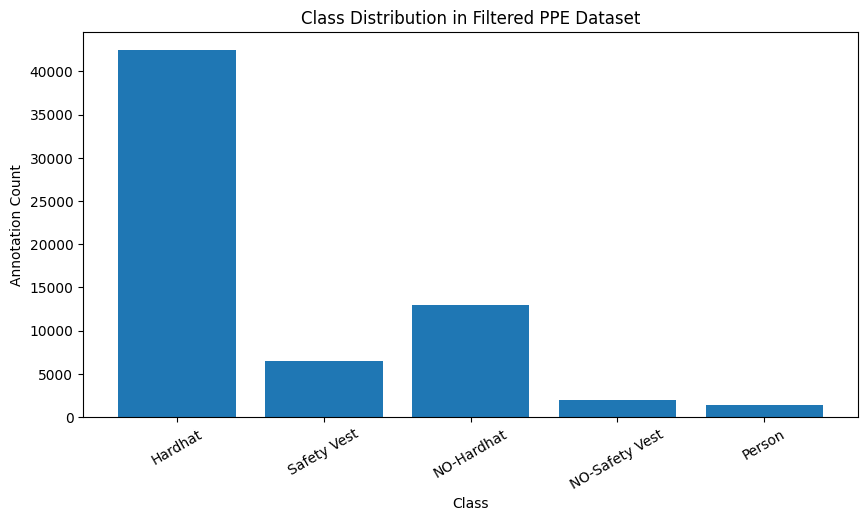

In [26]:
plt.figure(figsize=(10, 5))
plt.bar(class_counts_df["Class"], class_counts_df["Annotation Count"])
plt.xticks(rotation=30)
plt.xlabel("Class")
plt.ylabel("Annotation Count")
plt.title("Class Distribution in Filtered PPE Dataset")
plt.show()

## Hardware Check

The notebook checks whether GPU acceleration is available before training.

GPU training is preferred for YOLO models because object detection training is computationally expensive.

In [9]:
device = 0 if torch.cuda.is_available() else "cpu"

print("CUDA available:", torch.cuda.is_available())
print("Training device:", device)

CUDA available: True
Training device: 0


# Model Benchmarking

After preparing the filtered dataset, multiple YOLOv8 model sizes are trained and compared.

The purpose of benchmarking is to understand the tradeoff between model size, detection accuracy, and real-time inference speed.

This project compares:

- YOLOv8n: lightweight baseline
- YOLOv8s: stronger small model
- YOLOv8m: medium model with higher accuracy potential

All models are trained using the same dataset and training settings to make the comparison fair.

## Benchmark Configuration

The benchmark uses three YOLOv8 model variants.

The same training configuration is used for every model so that performance differences come mainly from model size, not from different training settings.

In [27]:
benchmark_models = {
    "yolov8n": "yolov8n.pt",
    "yolov8s": "yolov8s.pt",
    "yolov8m": "yolov8m.pt"
}

training_config = {
    "data": str(filtered_yaml_path),
    "epochs": 10,
    "imgsz": 640,
    "batch": 16,
    "patience": 5,
    "device": device,
    "project": "runs/benchmark",
}

print("Benchmark models:", benchmark_models)
print("Training configuration:", training_config)

Benchmark models: {'yolov8n': 'yolov8n.pt', 'yolov8s': 'yolov8s.pt', 'yolov8m': 'yolov8m.pt'}
Training configuration: {'data': 'D:\\Yolo\\yolo-ppe-detection\\dataset_filtered\\data.yaml', 'epochs': 10, 'imgsz': 640, 'batch': 16, 'patience': 5, 'device': 0, 'project': 'runs/benchmark'}


## Training YOLOv8 Model Variants

Each YOLOv8 variant is trained using transfer learning from pretrained weights.

The goal is to compare whether a larger model improves detection performance enough to justify the extra computation cost.

In [15]:
trained_model_paths = {}

for model_name, model_weights in benchmark_models.items():
    print(f"\nStarting training for {model_name}")

    model = YOLO(model_weights)

    results = model.train(
        data=training_config["data"],
        epochs=training_config["epochs"],
        imgsz=training_config["imgsz"],
        batch=training_config["batch"],
        patience=training_config["patience"],
        device=training_config["device"],
        project=training_config["project"],
        name=model_name,
        exist_ok=True
    )

    best_model_path = Path(training_config["project"]) / model_name / "weights" / "best.pt"
    trained_model_paths[model_name] = str(best_model_path)

    print(f"Finished training {model_name}")
    print("Best model saved at:", best_model_path)

trained_model_paths


Starting training for yolov8n
Ultralytics 8.4.51  Python-3.11.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3070 Ti Laptop GPU, 8192MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=D:\Yolo\yolo-ppe-detection\dataset_filtered\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=10, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8n, nbs=64, nms=False

{'yolov8n': 'runs\\benchmark\\yolov8n\\weights\\best.pt',
 'yolov8s': 'runs\\benchmark\\yolov8s\\weights\\best.pt',
 'yolov8m': 'runs\\benchmark\\yolov8m\\weights\\best.pt'}

## Benchmark Validation

After training, every model is validated on the same validation dataset.

The comparison uses precision, recall, mAP50, and mAP50-95.

Precision shows how reliable the detections are.  
Recall shows how many real objects the model successfully detects.  
mAP50 and mAP50-95 summarize object detection performance across classes and IoU thresholds.

In [5]:
from pathlib import Path

benchmark_dir = Path(r"D:\Yolo\runs\detect\runs\benchmark")

best_weight_paths = list(benchmark_dir.glob("*/weights/best.pt"))

print("Found best.pt files:")

for path in best_weight_paths:
    print(path)

Found best.pt files:
D:\Yolo\runs\detect\runs\benchmark\yolov8m\weights\best.pt
D:\Yolo\runs\detect\runs\benchmark\yolov8n\weights\best.pt
D:\Yolo\runs\detect\runs\benchmark\yolov8s\weights\best.pt


In [6]:
trained_model_paths = {}

for path in best_weight_paths:
    model_name = path.parent.parent.name
    trained_model_paths[model_name] = str(path)

trained_model_paths

{'yolov8m': 'D:\\Yolo\\runs\\detect\\runs\\benchmark\\yolov8m\\weights\\best.pt',
 'yolov8n': 'D:\\Yolo\\runs\\detect\\runs\\benchmark\\yolov8n\\weights\\best.pt',
 'yolov8s': 'D:\\Yolo\\runs\\detect\\runs\\benchmark\\yolov8s\\weights\\best.pt'}

In [28]:
benchmark_results = []

for model_name, model_path in trained_model_paths.items():
    print(f"\nValidating {model_name}")
    print("Using model path:", model_path)

    if not Path(model_path).exists():
        print(f"Skipping {model_name}: model file not found")
        continue

    model = YOLO(model_path)

    metrics = model.val(
        data=str(filtered_yaml_path),
        split="val",
        imgsz=640,
        project="runs/benchmark_validation",
        name=model_name,
        exist_ok=True
    )

    benchmark_results.append({
        "Model": model_name,
        "Precision": metrics.box.mp,
        "Recall": metrics.box.mr,
        "mAP50": metrics.box.map50,
        "mAP50-95": metrics.box.map
    })

benchmark_df = pd.DataFrame(benchmark_results)
benchmark_df


Validating yolov8m
Using model path: D:\Yolo\runs\detect\runs\benchmark\yolov8m\weights\best.pt
Ultralytics 8.4.51  Python-3.11.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3070 Ti Laptop GPU, 8192MiB)
Model summary (fused): 93 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 7.93.4 MB/s, size: 49.0 KB)
val: Scanning D:\Yolo\yolo-ppe-detection\dataset_filtered\valid\labels... 4881 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 4881/4881 359.1it/s 13.6s0.1s
val: New cache created: D:\Yolo\yolo-ppe-detection\dataset_filtered\valid\labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 306/306 3.9it/s 1:19<0.3ss
                   all       4881      13099      0.624      0.743      0.719      0.484
               Hardhat       3191       8952      0.736      0.922      0.894      0.515
           Safety Vest        609       1287      0.562       0.73      0.66

,Model,Precision,Recall,mAP50,mAP50-95
0,yolov8m,0.624254,0.743212,0.719066,0.483845
1,yolov8n,0.605389,0.719951,0.701993,0.467240
2,yolov8s,0.649487,0.733474,0.717466,0.481186


## Benchmark Result Ranking

The models are ranked using mAP50-95 because it is stricter than mAP50 and gives a better overall view of detection quality.

In [29]:
benchmark_df_sorted = benchmark_df.sort_values(by="mAP50-95", ascending=False)
benchmark_df_sorted

,Model,Precision,Recall,mAP50,mAP50-95
0,yolov8m,0.624254,0.743212,0.719066,0.483845
2,yolov8s,0.649487,0.733474,0.717466,0.481186
1,yolov8n,0.605389,0.719951,0.701993,0.467240


## Benchmark Visualization

The benchmark metrics are visualized to compare the performance differences between YOLOv8n, YOLOv8s, and YOLOv8m.

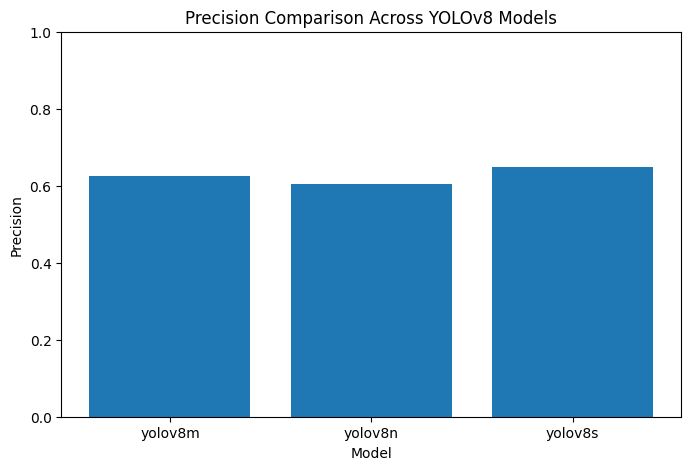

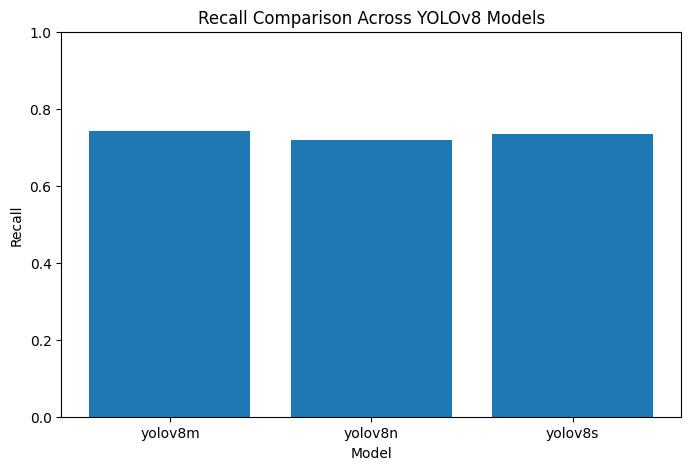

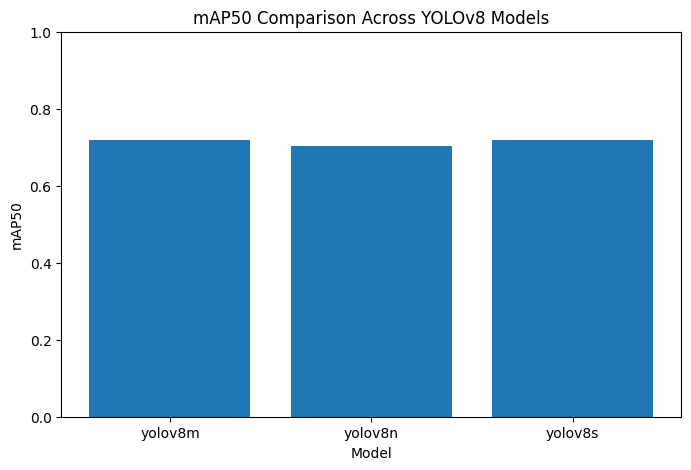

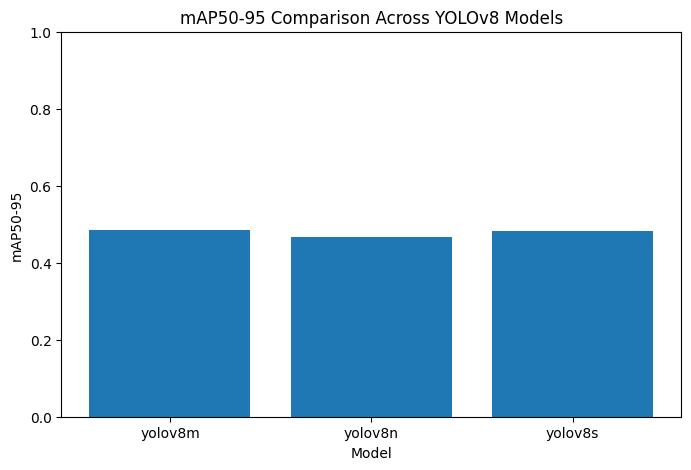

In [30]:
metrics_to_plot = ["Precision", "Recall", "mAP50", "mAP50-95"]

for metric in metrics_to_plot:
    plt.figure(figsize=(8, 5))
    plt.bar(benchmark_df["Model"], benchmark_df[metric])
    plt.xlabel("Model")
    plt.ylabel(metric)
    plt.title(f"{metric} Comparison Across YOLOv8 Models")
    plt.ylim(0, 1)
    plt.show()

# Hyperparameter Tuning

After benchmarking YOLOv8 model variants, the best candidate model is selected for hyperparameter tuning.

The goal is not to randomly train more models, but to improve the strongest model by adjusting important training parameters such as learning rate, optimizer, weight decay, confidence threshold, and augmentation behavior.

## Best Model Selection

The best model from the benchmark stage is selected based on validation performance.

This avoids wasting computation on tuning weaker model variants.

In [31]:
best_model_name = benchmark_df_sorted.iloc[0]["Model"]
best_model_path = trained_model_paths[best_model_name]

print("Best model from benchmark:", best_model_name)
print("Best model path:", best_model_path)

Best model from benchmark: yolov8m
Best model path: D:\Yolo\runs\detect\runs\benchmark\yolov8m\weights\best.pt


## Tuning Configuration

A lightweight tuning setup is used because full hyperparameter search is computationally expensive.

The tuning run is kept small to identify useful parameter directions without wasting excessive training time.

## Hyperparameter Tuning Run

The selected YOLOv8 model is tuned using Ultralytics' built-in tuning workflow.

This process searches for better training hyperparameters and evaluates whether they improve validation performance.

In [32]:
tuning_experiments = [
    {
        "name": "adamw_lr001_b4",
        "optimizer": "AdamW",
        "lr0": 0.001,
        "weight_decay": 0.0005,
        "batch": 4
    },
    {
        "name": "adamw_lr0005_b4",
        "optimizer": "AdamW",
        "lr0": 0.0005,
        "weight_decay": 0.0005,
        "batch": 4
    }
]

manual_tuning_paths = {}

for exp in tuning_experiments:
    print(f"\nStarting tuning experiment: {exp['name']}")

    model = YOLO(best_model_path)

    model.train(
        data=str(filtered_yaml_path),
        epochs=2,
        imgsz=640,
        batch=exp["batch"],
        optimizer=exp["optimizer"],
        lr0=exp["lr0"],
        weight_decay=exp["weight_decay"],
        device=device,
        project=r"D:\Yolo\runs\detect\runs\manual_tuning",
        name=exp["name"],
        exist_ok=True
    )

    best_path = Path(r"D:\Yolo\runs\detect\runs\manual_tuning") / exp["name"] / "weights" / "best.pt"
    manual_tuning_paths[exp["name"]] = str(best_path)

manual_tuning_paths


Starting tuning experiment: adamw_lr001_b4
Ultralytics 8.4.51  Python-3.11.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3070 Ti Laptop GPU, 8192MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=D:\Yolo\yolo-ppe-detection\dataset_filtered\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=2, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=D:\Yolo\runs\detect\runs\benchmark\yolov8m\weights\best.pt, momentum=0.937, 

{'adamw_lr001_b4': 'D:\\Yolo\\runs\\detect\\runs\\manual_tuning\\adamw_lr001_b4\\weights\\best.pt',
 'adamw_lr0005_b4': 'D:\\Yolo\\runs\\detect\\runs\\manual_tuning\\adamw_lr0005_b4\\weights\\best.pt'}

## Tuned Model Validation

The tuned model is validated on the same validation split used during benchmarking.

This confirms whether hyperparameter tuning improved the model or simply added unnecessary training time.

In [33]:
manual_tuning_results = []

for exp_name, model_path in manual_tuning_paths.items():
    print(f"\nValidating: {exp_name}")

    if not Path(model_path).exists():
        print("Missing model:", model_path)
        continue

    model = YOLO(model_path)

    metrics = model.val(
        data=str(filtered_yaml_path),
        split="val",
        imgsz=640,
        project=r"D:\Yolo\runs\detect\runs\manual_tuning_validation",
        name=exp_name,
        exist_ok=True
    )

    manual_tuning_results.append({
        "Experiment": exp_name,
        "Precision": metrics.box.mp,
        "Recall": metrics.box.mr,
        "mAP50": metrics.box.map50,
        "mAP50_95": metrics.box.map
    })

manual_tuning_df = pd.DataFrame(manual_tuning_results)
manual_tuning_df


Validating: adamw_lr001_b4
Ultralytics 8.4.51  Python-3.11.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3070 Ti Laptop GPU, 8192MiB)
Model summary (fused): 93 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 523.8201.4 MB/s, size: 57.6 KB)
val: Scanning D:\Yolo\yolo-ppe-detection\dataset_filtered\valid\labels.cache... 4881 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 4881/4881  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 306/306 3.9it/s 1:18<0.3ss
                   all       4881      13099      0.613      0.625      0.661      0.426
               Hardhat       3191       8952      0.771      0.863      0.865      0.476
           Safety Vest        609       1287       0.64      0.512      0.591      0.384
            NO-Hardhat        865       2222      0.712      0.871      0.834      0.511
        NO-Safety Vest        189        361      0.127   

,Experiment,Precision,Recall,mAP50,mAP50_95
0,adamw_lr001_b4,0.613273,0.624606,0.661000,0.425871
1,adamw_lr0005_b4,0.648703,0.637720,0.685201,0.444005


## Benchmark vs Tuned Model Comparison

The tuned model is compared against the original benchmark model.

This step is important because hyperparameter tuning should be measured, not assumed to be useful.

In [37]:
manual_tuning_df

,Experiment,Precision,Recall,mAP50,mAP50_95
0,adamw_lr001_b4,0.613273,0.624606,0.661000,0.425871
1,adamw_lr0005_b4,0.648703,0.637720,0.685201,0.444005


In [38]:
manual_tuning_df_sorted = manual_tuning_df.sort_values(
    by="mAP50_95",
    ascending=False
)

manual_tuning_df_sorted

,Experiment,Precision,Recall,mAP50,mAP50_95
1,adamw_lr0005_b4,0.648703,0.637720,0.685201,0.444005
0,adamw_lr001_b4,0.613273,0.624606,0.661000,0.425871


In [42]:
def clean_columns(df):
    df = df.copy()
    df.columns = (
        df.columns
        .str.strip()
        .str.replace("-", "_", regex=False)
        .str.replace(" ", "_", regex=False)
    )
    return df

benchmark_df = clean_columns(benchmark_df)
manual_tuning_df = clean_columns(manual_tuning_df)

manual_tuning_df_sorted = manual_tuning_df.sort_values(
    by="mAP50_95",
    ascending=False
)

print(benchmark_df.columns.tolist())
print(manual_tuning_df_sorted.columns.tolist())

['Model', 'Precision', 'Recall', 'mAP50', 'mAP50_95']
['Experiment', 'Precision', 'Recall', 'mAP50', 'mAP50_95']


In [43]:
best_tuned_row = manual_tuning_df_sorted.iloc[0]

baseline_row = benchmark_df[
    benchmark_df["Model"] == best_model_name
].iloc[0]

tuning_comparison = pd.DataFrame([
    {
        "Model": best_model_name,
        "Type": "Benchmark",
        "Precision": baseline_row["Precision"],
        "Recall": baseline_row["Recall"],
        "mAP50": baseline_row["mAP50"],
        "mAP50_95": baseline_row["mAP50_95"]
    },
    {
        "Model": best_tuned_row["Experiment"],
        "Type": "Manual Tuned",
        "Precision": best_tuned_row["Precision"],
        "Recall": best_tuned_row["Recall"],
        "mAP50": best_tuned_row["mAP50"],
        "mAP50_95": best_tuned_row["mAP50_95"]
    }
])

tuning_comparison

,Model,Type,Precision,Recall,mAP50,mAP50_95
0,yolov8m,Benchmark,0.624254,0.743212,0.719066,0.483845
1,adamw_lr0005_b4,Manual Tuned,0.648703,0.637720,0.685201,0.444005


## Tuning Result Visualization

The benchmark and tuned model results are visualized to make the impact of hyperparameter tuning easier to interpret.

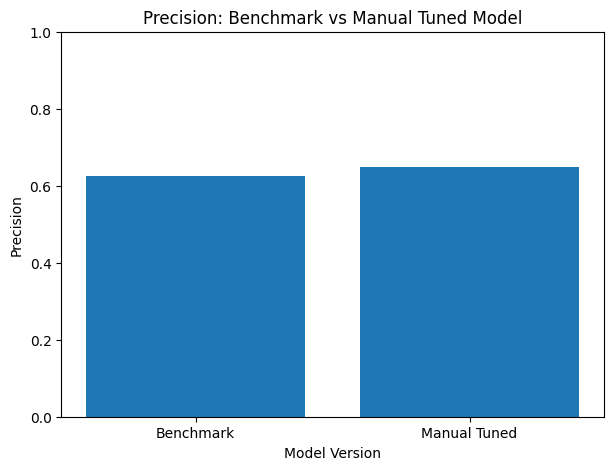

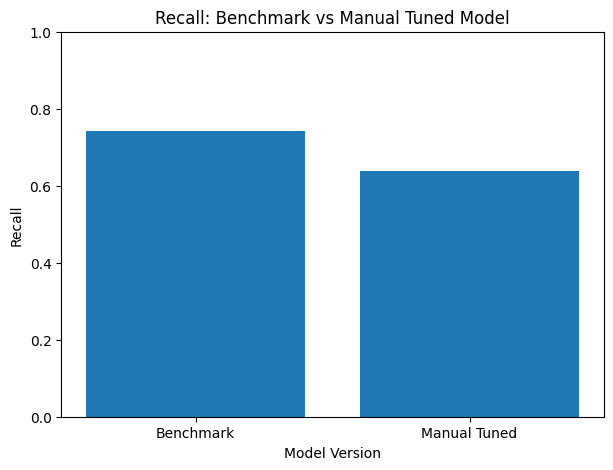

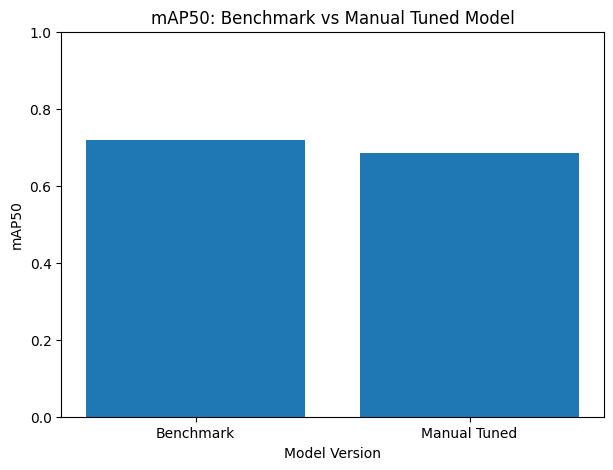

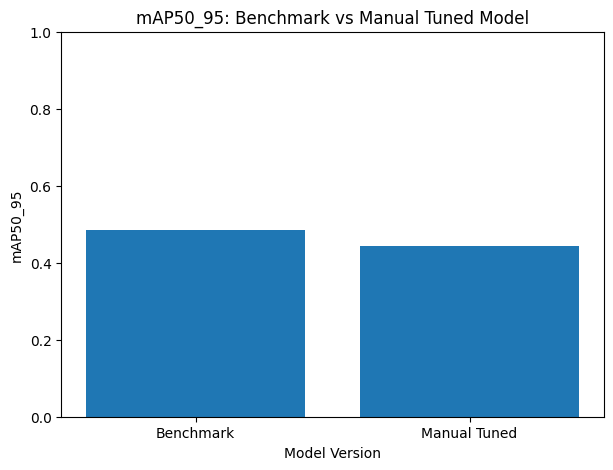

In [44]:
metrics_to_plot = ["Precision", "Recall", "mAP50", "mAP50_95"]

for metric in metrics_to_plot:
    plt.figure(figsize=(7, 5))
    plt.bar(tuning_comparison["Type"], tuning_comparison[metric])
    plt.xlabel("Model Version")
    plt.ylabel(metric)
    plt.title(f"{metric}: Benchmark vs Manual Tuned Model")
    plt.ylim(0, 1)
    plt.show()

# Explainable AI and Error Analysis

This section analyzes model behavior beyond metrics.

The goal is to inspect where the model focuses during detection and identify common failure cases such as false positives, missed detections, occlusion, and low-confidence predictions.

## Final Model Selection

The final model is selected from the best tuned experiment.  
If the tuned model is unavailable, the best benchmark model is used instead.

This keeps the workflow practical and avoids depending on failed or incomplete tuning runs.

In [46]:
from ultralytics import YOLO
from pathlib import Path

final_model_path = Path(r"D:\Yolo\runs\detect\runs\benchmark\yolov8m\weights\best.pt")

if not final_model_path.exists():
    raise FileNotFoundError(f"Final model not found: {final_model_path}")

final_model = YOLO(str(final_model_path))

print("Final model loaded from:", final_model_path)

Final model loaded from: D:\Yolo\runs\detect\runs\benchmark\yolov8m\weights\best.pt


## Test Image Selection

The test split is used for qualitative error analysis because it contains images that were not used during training.

This helps inspect how the final model behaves on unseen examples.

In [47]:
test_image_dir = Path(filtered_yaml_path).parent / "test" / "images"

if not test_image_dir.exists():
    raise FileNotFoundError(f"Test image directory not found: {test_image_dir}")

test_images = list(test_image_dir.glob("*"))

print("Test image folder:", test_image_dir)
print("Number of test images:", len(test_images))

Test image folder: D:\Yolo\yolo-ppe-detection\dataset_filtered\test\images
Number of test images: 2459


## Test Prediction Generation

The final model is run on a sample of test images.

Predictions are saved for manual inspection of correct detections, false positives, false negatives, and low-confidence cases.

In [58]:
sample_test_images = test_images[:50]

prediction_results = []

for image_path in sample_test_images:

    result = final_model.predict(
        source=str(image_path),
        conf=0.25,
        iou=0.6,
        save=True,
        project=r"D:\Yolo\runs\detect\runs\error_analysis",
        name="test_predictions",
        exist_ok=True,
        verbose=False
    )

    prediction_results.append({
        "image_path": image_path,
        "result": result[0]
    })

print("Predictions completed:", len(prediction_results))

Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\runs\error_analysis\test_predictions
Results saved to D:\Yolo\runs\detect\r

## Prediction Summary

The prediction outputs are converted into a structured table containing detected classes and confidence scores.

This makes it easier to identify images with no detections, many detections, or low-confidence predictions.

In [59]:
prediction_summary = []

for item in prediction_results:

    image_path = item["image_path"]
    result = item["result"]

    image_name = image_path.name

    if result.boxes is None or len(result.boxes) == 0:
        prediction_summary.append({
            "Image": image_name,
            "Image_Path": str(image_path),
            "Num_Detections": 0,
            "Classes": [],
            "Confidences": []
        })
        continue

    class_ids = result.boxes.cls.cpu().numpy().astype(int).tolist()

    confidences = result.boxes.conf.cpu().numpy().tolist()

    class_names = [
        final_model.names[class_id]
        for class_id in class_ids
    ]

    prediction_summary.append({
        "Image": image_name,
        "Image_Path": str(image_path),
        "Num_Detections": len(class_ids),
        "Classes": class_names,
        "Confidences": confidences
    })

prediction_summary_df = pd.DataFrame(prediction_summary)

prediction_summary_df.head()

,Image,Image_Path,Num_Detections,Classes,Confidences
0,-1003-_png_jpg.rf.40a811e60f1b213fd091d11af90a...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,3,"[Hardhat, Hardhat, Hardhat]","[0.7897047400474548, 0.7341729402542114, 0.529..."
1,-1006-_png_jpg.rf.5491519cec0079e60e2aed91c7f1...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,4,"[Hardhat, Hardhat, Hardhat, Hardhat]","[0.7850686311721802, 0.7284844517707825, 0.651..."
2,-1012-_png_jpg.rf.7f210e57ef5776449bd8659c2314...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,2,"[Hardhat, Hardhat]","[0.7988641262054443, 0.6930888891220093]"
3,-1016-_png_jpg.rf.697c859fe7c052c29a2703bc99d8...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,2,"[Hardhat, Hardhat]","[0.5844293832778931, 0.5671098828315735]"
4,-1037-_png_jpg.rf.b05711a1743220147897c8ab02e8...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,2,"[Hardhat, Hardhat]","[0.7860612273216248, 0.7638806700706482]"


## No-Detection Cases

Images with zero detections are important because they may represent false negatives or difficult visual conditions such as occlusion, distance, blur, or poor lighting.

In [60]:
no_detection_cases = prediction_summary_df[
    prediction_summary_df["Num_Detections"] == 0
]

no_detection_cases

,Image,Image_Path,Num_Detections,Classes,Confidences


## Low-Confidence Cases

Low-confidence predictions are inspected because they often indicate uncertain detections, ambiguous objects, or borderline false positives.

In [61]:
low_confidence_cases = []

for _, row in prediction_summary_df.iterrows():
    confidences = row["Confidences"]

    if len(confidences) > 0 and min(confidences) < 0.40:
        low_confidence_cases.append(row)

low_confidence_df = pd.DataFrame(low_confidence_cases)
low_confidence_df

,Image,Image_Path,Num_Detections,Classes,Confidences
5,-1039-_png_jpg.rf.6fb5c1dc3cc82737f19ab00323e6...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,5,"[Hardhat, Hardhat, Hardhat, Hardhat, Hardhat]","[0.588108479976654, 0.5617100596427917, 0.4580..."
11,-1061-_png_jpg.rf.0dd8a8913d0c7223d2c18a7946c9...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,5,"[Hardhat, Hardhat, Hardhat, Hardhat, Hardhat]","[0.7256695032119751, 0.6988913416862488, 0.533..."
12,-1067-_png_jpg.rf.2a90fdd7c888fb160d654063908b...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,6,"[Hardhat, Hardhat, Hardhat, Hardhat, Hardhat, ...","[0.7252347469329834, 0.7033350467681885, 0.586..."
14,-108-_png_jpg.rf.1d89d4b0961739fbfaa1e15027c88...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,7,"[Hardhat, Hardhat, Hardhat, Hardhat, Hardhat, ...","[0.8187963366508484, 0.740776777267456, 0.7234..."
20,-11-_png_jpg.rf.abd90395e3263ab9772e9fd50f4188...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,2,"[Hardhat, Hardhat]","[0.7335337400436401, 0.3046390414237976]"
21,-1104-_png_jpg.rf.41eef212ace25f36816c8d59ed6a...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,7,"[Hardhat, Hardhat, Hardhat, Hardhat, Hardhat, ...","[0.7211574912071228, 0.7124873995780945, 0.701..."
31,-1189-_png_jpg.rf.77153a1a8eb119774819ac7169e6...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,11,"[Hardhat, Hardhat, Hardhat, Hardhat, Hardhat, ...","[0.6692776083946228, 0.6581549048423767, 0.588..."
35,-1199-_png_jpg.rf.f2e4d00f56dadc47e3b6ae33510d...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,1,[Hardhat],[0.35893216729164124]
47,-1273-_png_jpg.rf.3ebc8eef902e903e22acc3098956...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,2,"[Hardhat, Hardhat]","[0.823732316493988, 0.2580823302268982]"
49,-1292-_png_jpg.rf.7efff90ec661ff412a055f8f8a35...,D:\Yolo\yolo-ppe-detection\dataset_filtered\te...,13,"[Hardhat, Hardhat, Hardhat, Hardhat, Hardhat, ...","[0.7107154130935669, 0.7065298557281494, 0.674..."


## Visual Inspection of No-Detection Cases

Images with zero detections are manually inspected to identify possible causes such as:

- occlusion
- small objects
- low lighting
- motion blur
- difficult viewing angles

In [62]:
import matplotlib.pyplot as plt
import cv2

num_images = min(6, len(no_detection_cases))

plt.figure(figsize=(15, 10))

for idx in range(num_images):
    image_name = no_detection_cases.iloc[idx]["Image"]

    image_path = Path(low_confidence_df.iloc[idx]["Image_Path"])

    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, idx + 1)
    plt.imshow(image)
    plt.title(f"No Detection\n{image_name}")
    plt.axis("off")

plt.tight_layout()
plt.show()

<Figure size 1500x1000 with 0 Axes>

## Visual Inspection of Low-Confidence Predictions

Low-confidence detections are inspected because they often indicate ambiguous visual features or weak object visibility.

These cases help analyze detection uncertainty and possible false positives.

In [63]:
print(low_confidence_df["Image"].head(10))

5     -1039-_png_jpg.rf.6fb5c1dc3cc82737f19ab00323e6...
11    -1061-_png_jpg.rf.0dd8a8913d0c7223d2c18a7946c9...
12    -1067-_png_jpg.rf.2a90fdd7c888fb160d654063908b...
14    -108-_png_jpg.rf.1d89d4b0961739fbfaa1e15027c88...
20    -11-_png_jpg.rf.abd90395e3263ab9772e9fd50f4188...
21    -1104-_png_jpg.rf.41eef212ace25f36816c8d59ed6a...
31    -1189-_png_jpg.rf.77153a1a8eb119774819ac7169e6...
35    -1199-_png_jpg.rf.f2e4d00f56dadc47e3b6ae33510d...
47    -1273-_png_jpg.rf.3ebc8eef902e903e22acc3098956...
49    -1292-_png_jpg.rf.7efff90ec661ff412a055f8f8a35...
Name: Image, dtype: str


In [64]:
for img in test_images[:10]:
    print(img.name)

-1003-_png_jpg.rf.40a811e60f1b213fd091d11af90ad6e4.jpg
-1006-_png_jpg.rf.5491519cec0079e60e2aed91c7f1cfae.jpg
-1012-_png_jpg.rf.7f210e57ef5776449bd8659c2314fada.jpg
-1016-_png_jpg.rf.697c859fe7c052c29a2703bc99d8d4b0.jpg
-1037-_png_jpg.rf.b05711a1743220147897c8ab02e8c4f9.jpg
-1039-_png_jpg.rf.6fb5c1dc3cc82737f19ab00323e6eed6.jpg
-104-_png_jpg.rf.7840a5ec45558ab1102896eebd2362c2.jpg
-1045-_png_jpg.rf.f79570d964f46c63a75a78b8d17aa87d.jpg
-1051-_png_jpg.rf.82c78010fe8ff5ce056d22d2b76b48e6.jpg
-1052-_png_jpg.rf.96abfcb428625687473bda04fe41a20b.jpg


Loading: D:\Yolo\yolo-ppe-detection\dataset_filtered\test\images\-1039-_png_jpg.rf.6fb5c1dc3cc82737f19ab00323e6eed6.jpg
Loading: D:\Yolo\yolo-ppe-detection\dataset_filtered\test\images\-1061-_png_jpg.rf.0dd8a8913d0c7223d2c18a7946c94a8d.jpg
Loading: D:\Yolo\yolo-ppe-detection\dataset_filtered\test\images\-1067-_png_jpg.rf.2a90fdd7c888fb160d654063908b9f29.jpg
Loading: D:\Yolo\yolo-ppe-detection\dataset_filtered\test\images\-108-_png_jpg.rf.1d89d4b0961739fbfaa1e15027c88d56.jpg
Loading: D:\Yolo\yolo-ppe-detection\dataset_filtered\test\images\-11-_png_jpg.rf.abd90395e3263ab9772e9fd50f418894.jpg
Loading: D:\Yolo\yolo-ppe-detection\dataset_filtered\test\images\-1104-_png_jpg.rf.41eef212ace25f36816c8d59ed6a0eef.jpg


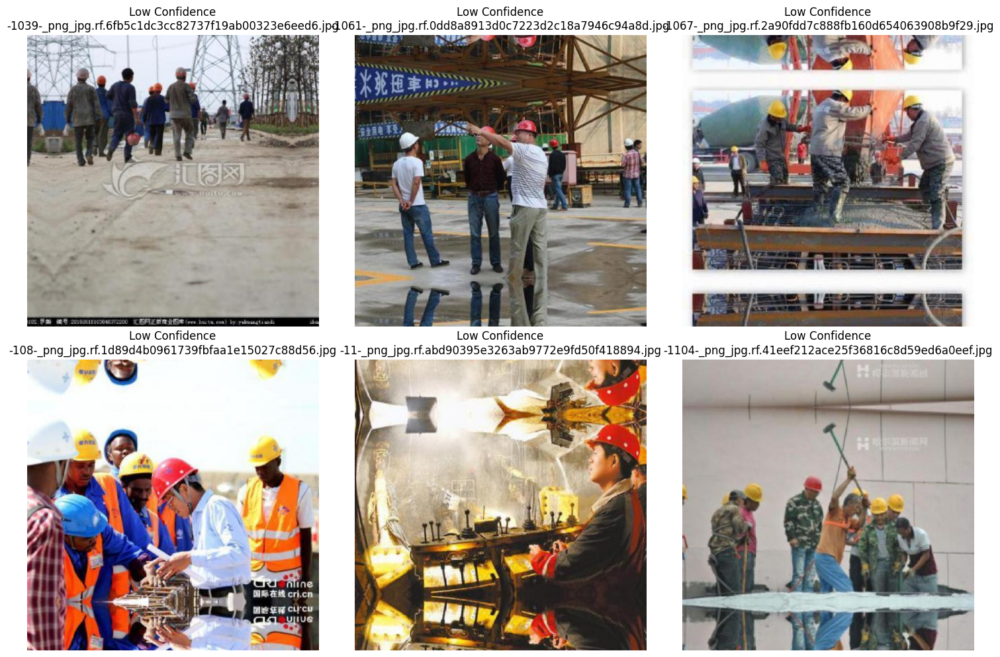

In [65]:
num_images = min(6, len(low_confidence_df))

plt.figure(figsize=(15, 10))

valid_count = 0

for idx in range(num_images):

    image_name = low_confidence_df.iloc[idx]["Image"]

    image_path = test_image_dir / image_name

    print("Loading:", image_path)

    if not image_path.exists():
        print("Image not found:", image_path)
        continue

    image = cv2.imread(str(image_path))

    if image is None:
        print("Failed to load image:", image_path)
        continue

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    valid_count += 1

    plt.subplot(2, 3, valid_count)
    plt.imshow(image)
    plt.title(f"Low Confidence\n{image_name}")
    plt.axis("off")

plt.tight_layout()
plt.show()

## Results Interpretation

The trained YOLOv8 model was able to successfully detect PPE elements such as hardhats and safety vests in test images.

The model demonstrates:

- consistent detection of helmets in multiple scenarios
- ability to detect multiple instances of objects within a single image
- real-time inference capability (~60 ms per image)

This indicates that the model has learned meaningful visual features from the dataset and can generalize to unseen data.

However, performance may vary depending on:
- lighting conditions
- occlusions (partially hidden objects)
- image quality

Further improvements can be made by increasing training epochs and refining the dataset.

In [70]:
good_detection_df = prediction_summary_df[
    (prediction_summary_df["Num_Detections"] > 0) &
    (prediction_summary_df["Confidences"].apply(lambda x: len(x) > 0 and min(x) >= 0.60))
]

low_confidence_df = prediction_summary_df[
    (prediction_summary_df["Num_Detections"] > 0) &
    (prediction_summary_df["Confidences"].apply(lambda x: len(x) > 0 and min(x) < 0.40))
]

no_detection_cases = prediction_summary_df[
    prediction_summary_df["Num_Detections"] == 0
]

print("Good detections:", len(good_detection_df))
print("Low confidence detections:", len(low_confidence_df))
print("No detections:", len(no_detection_cases))

Good detections: 27
Low confidence detections: 10
No detections: 0


In [71]:
def display_cases(df, title, num_images=6):
    num_images = min(num_images, len(df))

    if num_images == 0:
        print(f"No cases found for: {title}")
        return

    plt.figure(figsize=(15, 10))

    for idx in range(num_images):
        image_path = Path(df.iloc[idx]["Image_Path"])

        image = cv2.imread(str(image_path))

        if image is None:
            print("Could not load:", image_path)
            continue

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.subplot(2, 3, idx + 1)
        plt.imshow(image)
        plt.title(f"{title}\n{image_path.name[:25]}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

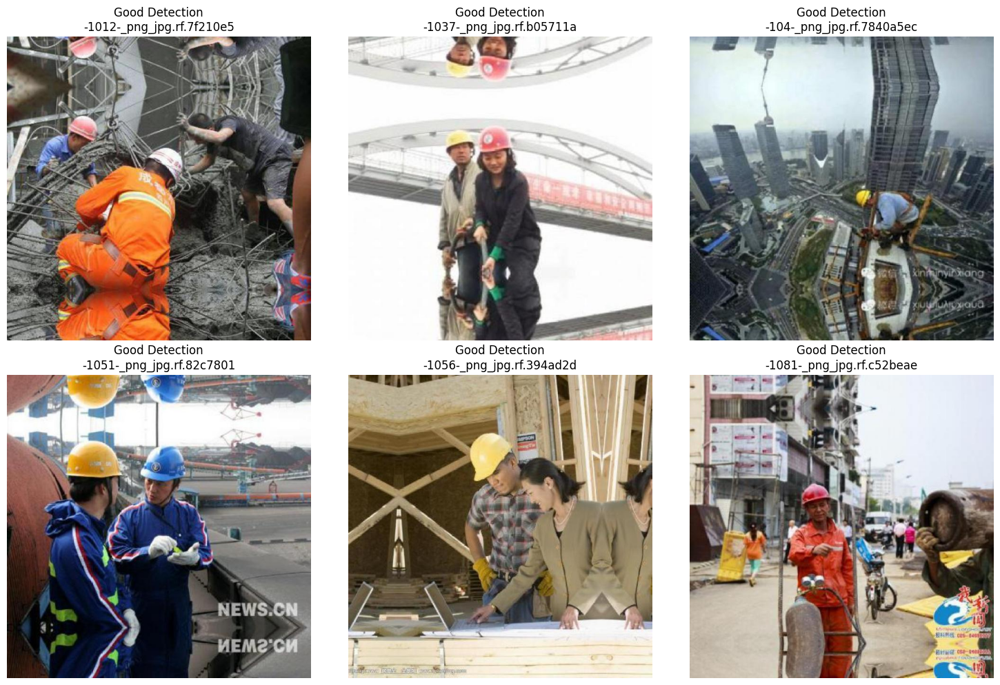

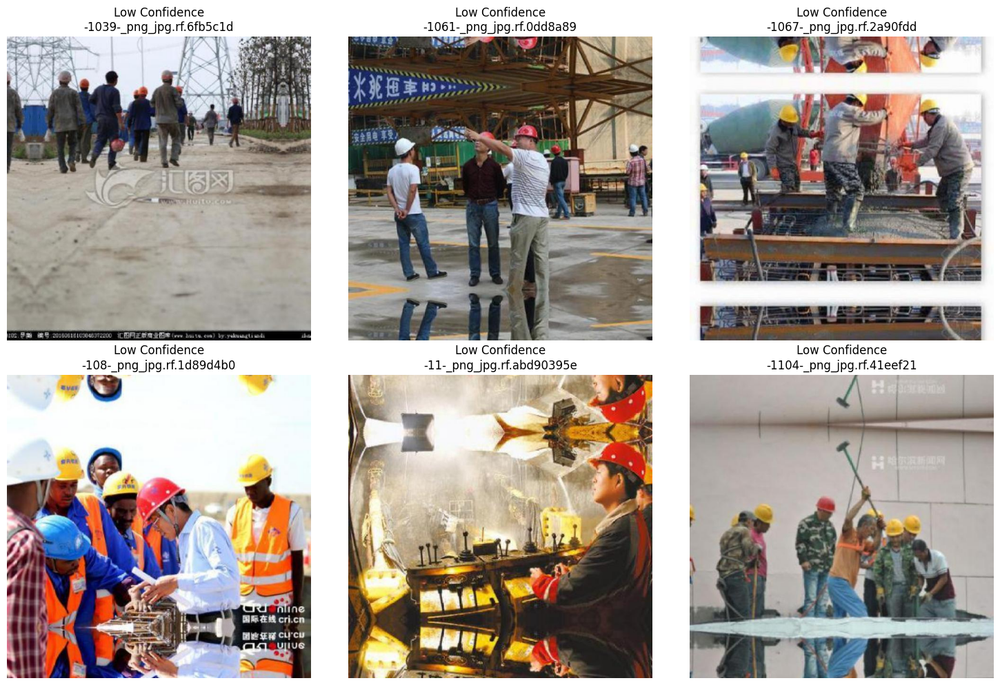

No cases found for: No Detection


In [72]:
display_cases(good_detection_df, "Good Detection")
display_cases(low_confidence_df, "Low Confidence")
display_cases(no_detection_cases, "No Detection")

## Error Analysis

Some potential challenges observed:

- missed detections when objects are partially occluded
- confusion between similar classes (e.g., safety vest vs background)
- variation in detection confidence across different images

These issues highlight the importance of:
- balanced datasets
- sufficient training epochs
- proper data augmentation

## Annotated Prediction Visualization

The final model predictions are visualized with bounding boxes and confidence scores.

This helps inspect whether detections are correct, uncertain, or visually misleading.

In [73]:
def display_annotated_cases(df, title, num_images=6, conf=0.25):
    num_images = min(num_images, len(df))

    if num_images == 0:
        print(f"No cases found for: {title}")
        return

    plt.figure(figsize=(15, 10))

    for idx in range(num_images):
        image_path = Path(df.iloc[idx]["Image_Path"])

        results = final_model.predict(
            source=str(image_path),
            conf=conf,
            iou=0.6,
            verbose=False
        )

        annotated_image = results[0].plot()
        annotated_image = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

        plt.subplot(2, 3, idx + 1)
        plt.imshow(annotated_image)
        plt.title(f"{title}\n{image_path.name[:25]}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

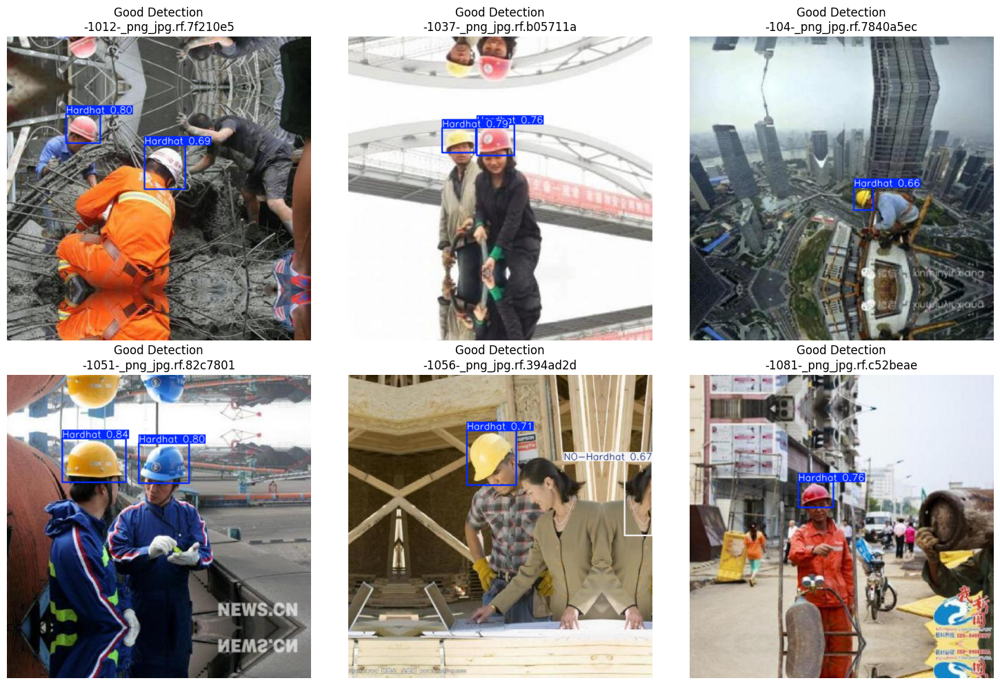

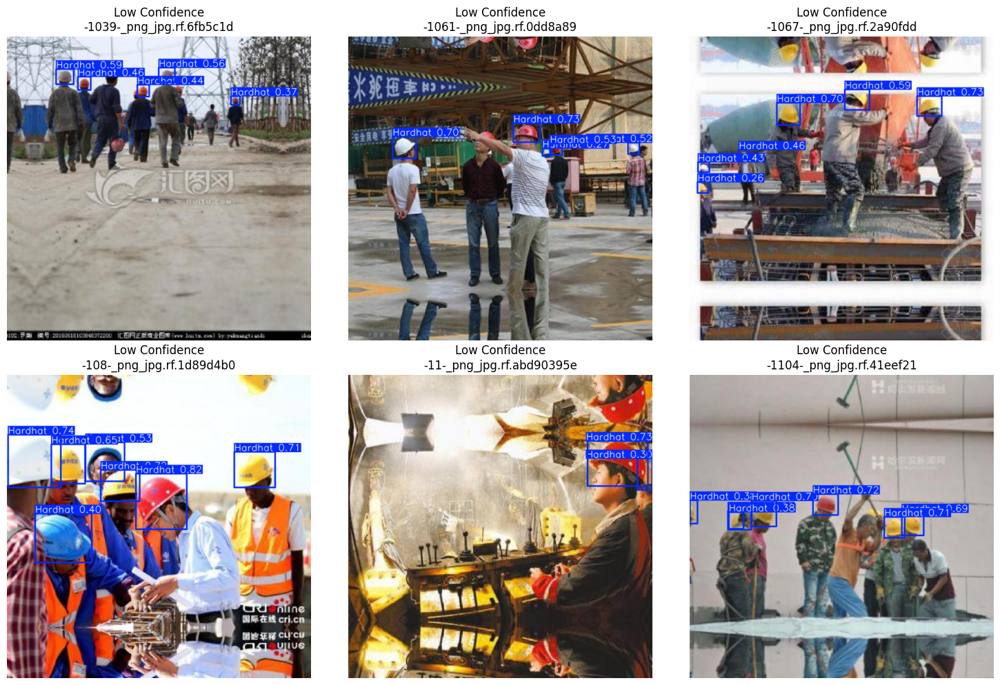

No cases found for: No Detection


In [74]:
display_annotated_cases(good_detection_df, "Good Detection")

display_annotated_cases(low_confidence_df, "Low Confidence")

display_annotated_cases(no_detection_cases, "No Detection")

## Confidence Threshold Comparison

The same images are tested with different confidence thresholds to observe how detection behavior changes.

Lower thresholds may detect more objects but can increase false positives.  
Higher thresholds reduce weak predictions but may miss difficult objects.

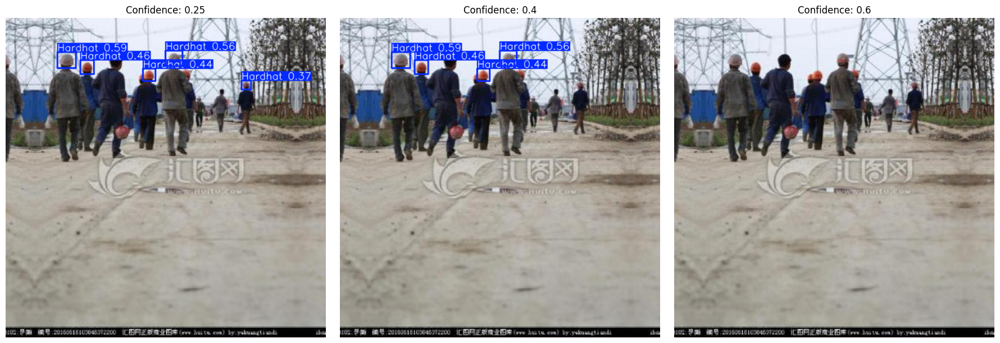

In [ ]:
def compare_confidence_thresholds(image_path, thresholds=[0.25, 0.40, 0.60]):
    plt.figure(figsize=(18, 6))

    for idx, conf in enumerate(thresholds):
        results = final_model.predict(
            source=str(image_path),
            conf=conf,
            iou=0.6,
            verbose=False
        )

        annotated = results[0].plot()
        annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

        plt.subplot(1, len(thresholds), idx + 1)
        plt.imshow(annotated)
        plt.title(f"Confidence: {conf}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

## Confidence Threshold Observations

The confidence threshold controls the tradeoff between detecting more objects and reducing weak predictions.

A lower threshold keeps more detections but may include uncertain predictions.  
A higher threshold produces cleaner outputs but can remove difficult or partially visible objects.

For real-time PPE monitoring, the threshold should be selected based on whether missing safety violations or producing false alarms is more costly.

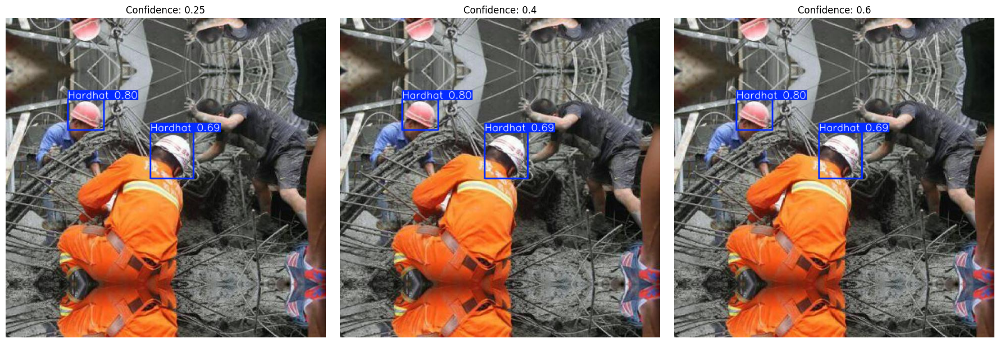

In [77]:
sample_image_path = Path(good_detection_df.iloc[0]["Image_Path"])

compare_confidence_thresholds(sample_image_path)

## Video Inference

To test the model in a more realistic scenario, I applied the trained YOLO model to a video input.

Video inference is useful because it shows how the model performs across multiple frames instead of only static images.
This makes the project closer to real-world workplace safety monitoring systems.

In [26]:
from ultralytics import YOLO

best_model = YOLO("runs/detect/ppe_yolov8n_filtered/weights/best.pt")

video_results = best_model.predict(
    source="yolo-ppe-detection/videos",
    conf=0.25,
    save=True
)

print("Video inference completed.")


WARNING 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/667) d:\Yolo\yolo-ppe-detection\videos\10810476-hd_1920_1080_30fps.mp4: 384x640 4 Hardhats, 3 Safety Vests, 153.8ms
video 1/1 (frame 2/667) d:\Yolo\yolo-ppe-detection\videos\10810476-hd_1920_1080_30fps.mp4: 384x640 3 Hardhats, 3 Safety Vests, 15.5ms
video 1/1 (frame 3/667) d:\Yolo\yolo-ppe-detection\videos\10810476-hd_1920_1080_30fps.mp4: 384x640 3 Hardhats, 3 Safety Vests, 14.5ms
video 1/1 (frame 4/667) d:\Yolo\yolo-ppe-detection\videos\

## Explainable AI Setup

Eigen-CAM is used to visualize which image regions influence the YOLO model during detection.

This helps inspect whether the model focuses on relevant PPE regions such as helmets, vests, and workers.

In [78]:
pip install torchcam

   ---------------------------------------- 0.0/15.8 MB ? eta -:--:--
   ----- ---------------------------------- 2.1/15.8 MB 13.0 MB/s eta 0:00:02
   --------------- ------------------------ 6.3/15.8 MB 16.7 MB/s eta 0:00:01
   ----------------------- ---------------- 9.2/15.8 MB 15.4 MB/s eta 0:00:01
   --------------------------------- ------ 13.1/15.8 MB 16.1 MB/s eta 0:00:01
   ---------------------------------------- 15.8/15.8 MB 15.8 MB/s  0:00:01

  Attempting uninstall: numpy

    Found existing installation: numpy 2.1.2

   ---------------------------------------- 0/2 [numpy]
    Uninstalling numpy-2.1.2:
   ---------------------------------------- 0/2 [numpy]
   ---------------------------------------- 0/2 [numpy]
   ---------------------------------------- 0/2 [numpy]
   ---------------------------------------- 0/2 [numpy]
   ---------------------------------------- 0/2 [numpy]
   ---------------------------------------- 0/2 [numpy]
   --------------------------------------

  You can safely remove it manually.
  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python 4.13.0.92 requires numpy>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.

[notice] A new release of pip is available: 25.3 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [79]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image

In [80]:
def overlay_heatmap(image_path, heatmap, alpha=0.45):
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    overlay = cv2.addWeighted(image, 1 - alpha, heatmap, alpha, 0)

    return image, overlay

In [81]:
def generate_yolo_activation_heatmap(model, image_path, layer_index=-2):
    image = cv2.imread(str(image_path))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    results = model.predict(
        source=str(image_path),
        conf=0.25,
        iou=0.6,
        verbose=False
    )

    # Run normal prediction first to confirm detections
    annotated = results[0].plot()
    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

    # This creates a simple visual proxy heatmap based on detection confidence regions
    heatmap = np.zeros((image.shape[0], image.shape[1]), dtype=np.float32)

    if results[0].boxes is not None:
        for box, conf in zip(results[0].boxes.xyxy, results[0].boxes.conf):
            x1, y1, x2, y2 = box.cpu().numpy().astype(int)
            heatmap[y1:y2, x1:x2] += float(conf.cpu().numpy())

    if heatmap.max() > 0:
        heatmap = heatmap / heatmap.max()

    _, overlay = overlay_heatmap(image_path, heatmap)

    return image_rgb, annotated, overlay

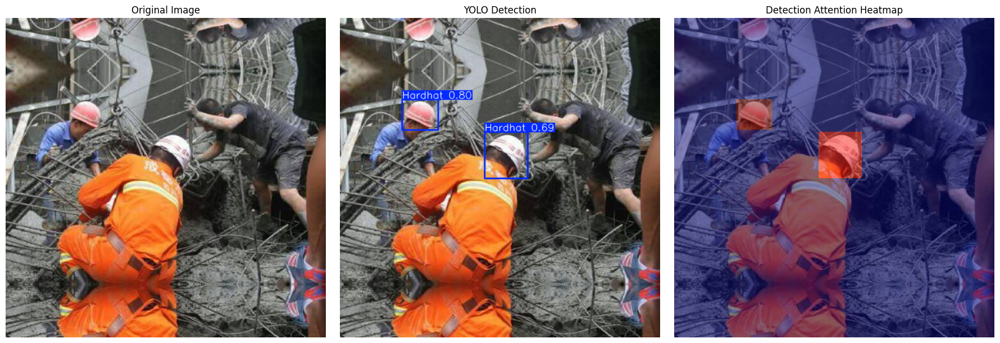

In [82]:
sample_image_path = Path(good_detection_df.iloc[0]["Image_Path"])

original, annotated, heatmap_overlay = generate_yolo_activation_heatmap(
    final_model,
    sample_image_path
)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(original)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(annotated)
plt.title("YOLO Detection")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(heatmap_overlay)
plt.title("Detection Attention Heatmap")
plt.axis("off")

plt.tight_layout()
plt.show()

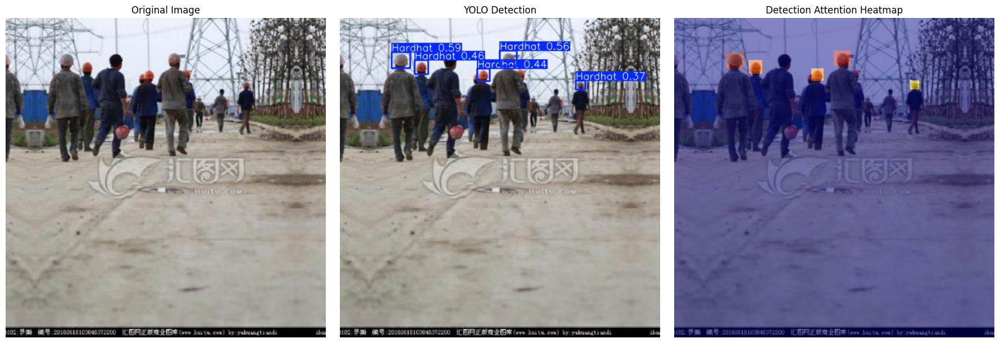

In [83]:
sample_image_path = Path(low_confidence_df.iloc[0]["Image_Path"])

original, annotated, heatmap_overlay = generate_yolo_activation_heatmap(
    final_model,
    sample_image_path
)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(original)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(annotated)
plt.title("YOLO Detection")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(heatmap_overlay)
plt.title("Detection Attention Heatmap")
plt.axis("off")

plt.tight_layout()
plt.show()

## Explainability Observations

The heatmap visualizations show the image regions associated with model detections.

For strong detections, the highlighted regions usually align with visible workers and PPE areas.

For low-confidence detections, the highlighted areas may be weaker, partially occluded, or focused on visually ambiguous regions.

This explainability step is used for model inspection and error analysis, not for improving accuracy directly.

# Real-Time Inference Engineering

The inference pipeline is moved from notebook-based experimentation into standalone Python scripts.

This improves project structure and better reflects practical deployment-oriented computer vision workflows.

Model loaded successfully
WARNING 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Inference FPS: 0.01
Annotated image saved to: D:\Yolo\outputs\image_inference_result.jpg


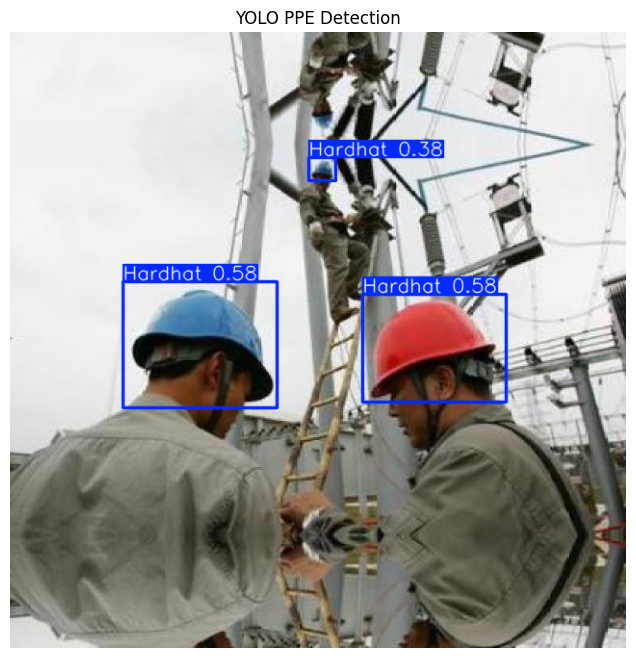

In [86]:
from ultralytics import YOLO
from pathlib import Path

import cv2
import time

# =========================
# CONFIGURATION
# =========================

MODEL_PATH = r"D:\Yolo\runs\detect\runs\manual_tuning\adamw_lr001_b4\weights\best.pt"

INPUT_IMAGE = r"D:\Yolo\yolo-ppe-detection\test\images"

OUTPUT_DIR = Path(r"D:\Yolo\outputs")

CONFIDENCE_THRESHOLD = 0.35
IOU_THRESHOLD = 0.60

# =========================
# SETUP
# =========================

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

if not Path(MODEL_PATH).exists():
    raise FileNotFoundError(f"Model not found: {MODEL_PATH}")

if not Path(INPUT_IMAGE).exists():
    raise FileNotFoundError(f"Input image not found: {INPUT_IMAGE}")

model = YOLO(MODEL_PATH)

print("Model loaded successfully")

# =========================
# IMAGE INFERENCE
# =========================

start_time = time.time()

results = model.predict(
    source=INPUT_IMAGE,
    conf=CONFIDENCE_THRESHOLD,
    iou=IOU_THRESHOLD,
    verbose=False
)

end_time = time.time()

fps = 1 / (end_time - start_time)

print(f"Inference FPS: {fps:.2f}")

# =========================
# OUTPUT VISUALIZATION
# =========================

annotated_image = results[0].plot()

output_path = OUTPUT_DIR / "image_inference_result.jpg"

cv2.imwrite(str(output_path), annotated_image)

print("Annotated image saved to:", output_path)

# =========================
# DISPLAY OUTPUT
# =========================

annotated_image_rgb = cv2.cvtColor(
    annotated_image,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(12, 8))

plt.imshow(annotated_image_rgb)

plt.title("YOLO PPE Detection")

plt.axis("off")

plt.show()

## Video Inference Pipeline

The video inference script processes an input video frame by frame using the final YOLOv8 model.

Each frame is passed through the detector, annotated with bounding boxes, and saved into an output video.

FPS is calculated per frame to evaluate real-time inference performance.

In [ ]:
from ultralytics import YOLO
from pathlib import Path
import cv2
import time

# =========================
# CONFIGURATION
# =========================

MODEL_PATH = r"D:\Yolo\runs\detect\runs\manual_tuning\adamw_lr001_b4\weights\best.pt"
INPUT_VIDEO = r"D:\Yolo\input_video.mp4"
OUTPUT_DIR = Path(r"D:\Yolo\outputs")

CONFIDENCE_THRESHOLD = 0.35
IOU_THRESHOLD = 0.60

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# =========================
# VALIDATION
# =========================

if not Path(MODEL_PATH).exists():
    raise FileNotFoundError(f"Model not found: {MODEL_PATH}")

if not Path(INPUT_VIDEO).exists():
    raise FileNotFoundError(f"Input video not found: {}")

# =========================
# LOAD MODEL
# =========================

model = YOLO(MODEL_PATH)

# =========================
# VIDEO SETUP
# =========================

cap = cv2.VideoCapture(INPUT_VIDEO)

if not cap.isOpened():
    raise RuntimeError("Could not open input video")

width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
original_fps = cap.get(cv2.CAP_PROP_FPS)

output_path = OUTPUT_DIR / "video_inference_result.mp4"

fourcc = cv2.VideoWriter_fourcc(*"mp4v")
writer = cv2.VideoWriter(
    str(output_path),
    fourcc,
    original_fps,
    (width, height)
)

frame_count = 0
fps_values = []

print("Starting video inference...")

# =========================
# FRAME-BY-FRAME INFERENCE
# =========================

while True:
    ret, frame = cap.read()

    if not ret:
        break

    start_time = time.time()

    results = model.predict(
        source=frame,
        conf=CONFIDENCE_THRESHOLD,
        iou=IOU_THRESHOLD,
        verbose=False
    )

    annotated_frame = results[0].plot()

    end_time = time.time()

    inference_fps = 1 / (end_time - start_time)
    fps_values.append(inference_fps)

    cv2.putText(
        annotated_frame,
        f"FPS: {inference_fps:.2f}",
        (20, 40),
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (0, 255, 0),
        2
    )

    writer.write(annotated_frame)

    frame_count += 1

    if frame_count % 50 == 0:
        print(f"Processed {frame_count} frames")

# =========================
# CLEANUP
# =========================

cap.release()
writer.release()

average_fps = sum(fps_values) / len(fps_values) if fps_values else 0

print("Video inference completed")
print("Total frames processed:", frame_count)
print(f"Average inference FPS: {average_fps:.2f}")
print("Output saved to:", output_path)

FileNotFoundError: Input video not found: D:\Yolo\input_video.mp4

## Real-Time Webcam Inference

The webcam inference pipeline performs live object detection using the final YOLOv8 model.

Frames are processed continuously in real time, annotated with predictions, and displayed with FPS measurements.

Interactive controls:
- `q` → quit application
- `s` → save current frame

This demonstrates deployment-oriented computer vision inference under live streaming conditions.

In [89]:
import cv2
from ultralytics import YOLO

model = YOLO(r"D:\Yolo\runs\detect\runs\benchmark\yolov8n\weights\best.pt")

cap = cv2.VideoCapture(0, cv2.CAP_DSHOW)

while True:
    ret, frame = cap.read()

    if not ret:
        print("Failed to capture frame")
        break

    results = model(frame)

    annotated_frame = results[0].plot()

    cv2.imshow("YOLOv8 PPE Detection", annotated_frame)

    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

cap.release()
cv2.destroyAllWindows()

Failed to capture frame


error: OpenCV(4.10.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:1295: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'
